# RetinaNet for Global Wheat🌱 Head Detection

> ### This Notebook is for Training of **Keras RetinaNet** for wheat head detection 🔍

<hr>

### For EDA and Image Data analysis📊 visit:
### https://www.kaggle.com/akhileshdkapse/global-wheat-detection-comprehensive-eda

### Table of contents
* Data Loading
* Mis-matched B.boxes fixection
* Image Data Visulization
* Data Per-Processing
* Model Traning
* Trained model Analysis/Visulization of test image data


## Data Loading

In [1]:
import numpy as np 
import pandas as pd 
import os
from glob import glob
import cv2
import ast
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

import time

import random
sns.set_style('whitegrid')

In [2]:
df= pd.read_csv('../input/global-wheat-detection/train.csv')
print('Totall Traning data: {} with {} unique images'.format(df.shape[0], len(df.image_id.unique())))
df.head()

Totall Traning data: 147793 with 3373 unique images


,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [3]:
def add_path(label):
    path='../input/global-wheat-detection/train'
    return os.path.join(path, label+'.jpg')

df['image_name']= df.image_id.apply(add_path)
df.head()

,image_id,width,height,bbox,source,image_name
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,../input/global-wheat-detection/train/b6ab77fd...
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,../input/global-wheat-detection/train/b6ab77fd...
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,../input/global-wheat-detection/train/b6ab77fd...
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,../input/global-wheat-detection/train/b6ab77fd...
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,../input/global-wheat-detection/train/b6ab77fd...


In [4]:
df.info()
#bbox -- String

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147793 entries, 0 to 147792
Data columns (total 6 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   image_id    147793 non-null  object
 1   width       147793 non-null  int64 
 2   height      147793 non-null  int64 
 3   bbox        147793 non-null  object
 4   source      147793 non-null  object
 5   image_name  147793 non-null  object
dtypes: int64(2), object(4)
memory usage: 6.8+ MB


In [5]:
df.bbox=df.bbox.apply(lambda x: ast.literal_eval(x))

In [6]:
df['x_min']= df.bbox.apply(lambda x: x[0])
df['y_min']= df.bbox.apply(lambda x: x[1])
df['x_max']= df.bbox.apply(lambda x: x[0]+ x[2])
df['y_max']= df.bbox.apply(lambda x: x[1]+ x[3])
df['prct_area_cov']= df.bbox.apply(lambda x: ((x[2]*x[3])/(1024.0*1024.0))*100)
df=df.drop('source', 1)
df.head()

,image_id,width,height,bbox,image_name,x_min,y_min,x_max,y_max,prct_area_cov
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",../input/global-wheat-detection/train/b6ab77fd...,834.0,222.0,890.0,258.0,0.192261
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",../input/global-wheat-detection/train/b6ab77fd...,226.0,548.0,356.0,606.0,0.719070
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",../input/global-wheat-detection/train/b6ab77fd...,377.0,504.0,451.0,664.0,1.129150
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",../input/global-wheat-detection/train/b6ab77fd...,834.0,95.0,943.0,202.0,1.112270
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",../input/global-wheat-detection/train/b6ab77fd...,26.0,144.0,150.0,261.0,1.383591


## Mis-matched B.boxes fixection
### We have encountered with Mis-matched Large Bounding Boxes in certain images for our EDA NOTEBOOK...



![](https://www.kaggleusercontent.com/kf/41590794/eyJhbGciOiJkaXIiLCJlbmMiOiJBMTI4Q0JDLUhTMjU2In0..wNU8w8SLUJMdER2nLmV0uA.bE7UWnqdhT5glaFaCMq4ReTOPK-XOCw2dZ_GRP_qdx-xLst2Df5bzmX3dvAiscihs5m0Dv8N5uZwVn_L8GPwXNfCliZgPsnBBxoJU2Ubxz0j7hdI1_H4BxpWM1aFKohGmuL7vh1kgunH3UDua8i_VHxmamOT3RE3ucyNAkH567mMcNIn3P-Nil4_5QuUtbZXzLh-ovee_nvMd1rPU_KDJqap8d5-gkixkxUMlX4oyb2j1qP3-9Dx5hM6RaaHo15eLUPevPZcNxdgNTj_xJbJ2fkxQzKfe8qaYAPoDwMh16qQUzKyq2eGf9o2MSWoF97F-pjOjHf_R8ONGrdnzD0vAVkCanJjOgUJ_uU8kfV83koFj63IpNld9SwO_OwBLQjANvdfA2ifq3Ek78UGfxPxh_cX6C0hYbZmB0GTpIYkhZjEBYQ3cq6M6GFoRzP6VcwU86ZnOa23KcFSGUnlV4DQxvfBaPf4e2dqEdyy80xLShyyP0PW7VgHXRVcIGKLiceLMMiW68pR4WaAEGFfDUHUF4tzVhD5-UU8cXKhCl5z--2q3bV2Hay5sZodpU61CS0UgdLkBqQjqcyH3F6HS_Iq2Xbso-IMHAdXtsk03yXNrN1ekn32tkulIGLA_PSd6f3S6zbgdIP1Hz7c8ZBSnSlXLyCWM-wOponEhFc7r1e_9rU.OQH__iA9D8ymBfeK7ornKg/__results___files/__results___38_2.png)


> ### Let's fix it 

Text(0.5, 1.0, 'Area per BBox Distribution')

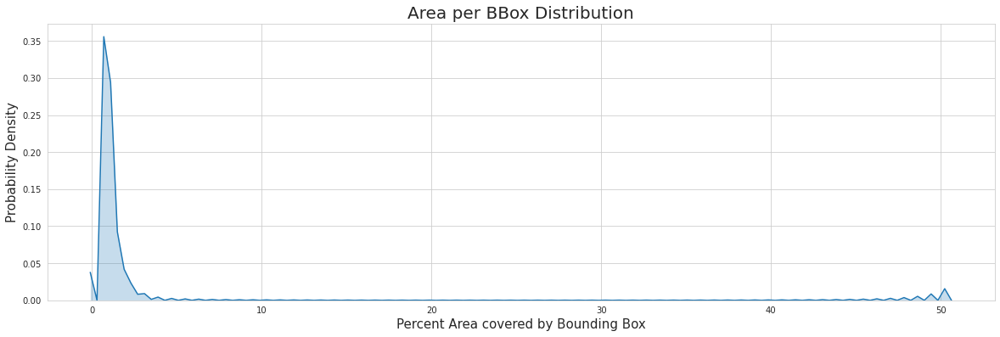

In [7]:
plt.figure(figsize=(20,6))
sns.kdeplot(df.prct_area_cov.values, shade=True)
plt.xlabel('Percent Area covered by Bounding Box', size=15); plt.ylabel('Probability Density', size=15)
plt.title('Area per BBox Distribution', size=20)

### B.B0x Area outliers:
* We can see most of the **Bounding Boxes are coverd less than 3% of totall area** on Actuall Image.
* **Outliers** are those BBoxes which have **coverd more than 5%** of tatall area of Image, as WHEAT HEAD covers less space in an image.

In [8]:
print('Rows we lost:', (df[(df.prct_area_cov<8) & (df.prct_area_cov>0.4)].shape[0]))
df=df[(df.prct_area_cov<6) & (df.prct_area_cov>0.3)]
df=df.reset_index()

Rows we lost: 99817


Text(0.5, 1.0, 'Area per BBox Distribution')

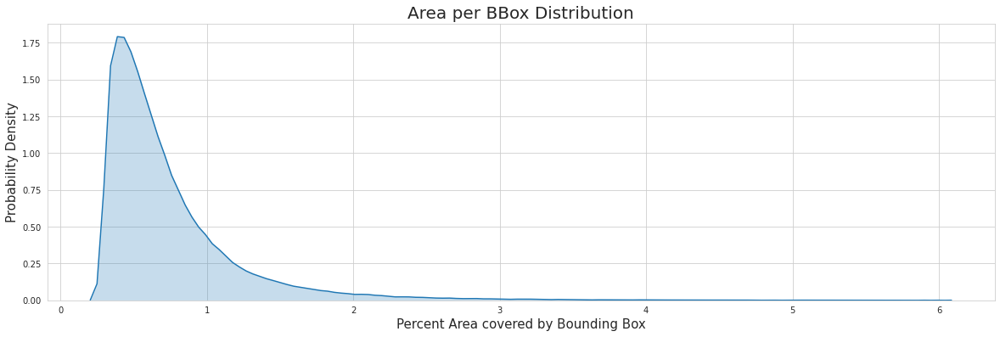

In [9]:
plt.figure(figsize=(20,6))
sns.kdeplot(df.prct_area_cov.values, shade=True)
plt.xlabel('Percent Area covered by Bounding Box', size=15); plt.ylabel('Probability Density', size=15)
plt.title('Area per BBox Distribution', size=20)

## Image Data Visulization

In [10]:
def load(path, resize=False, gray=False):
    img= cv2.imread(path)
    if resize:
        img= cv2.resize(img, (500,500))
    if gray:
        img= cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        img= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def draw_rec(img, boxes):
    for box in boxes:
        x,y,w,h= box
        x=int(x); y=int(y); w=int(w); h= int(h)
        img= cv2.rectangle(img, (x,y), (x+w, y+h), color=(16, 228, 214), thickness=3)
    return img

In [11]:
def draw_rand():
    index= random.randint(0, (df.shape[0]))
    label= df.image_id[index]
    data= df[df.image_id== label]
    path= '../input/global-wheat-detection/train'
    path= os.path.join(path, (label+'.jpg'))
    img= load(path)
    img2= img.copy()
    
    img2= draw_rec(img2, data.bbox.values)
    f, ax= plt.subplots(1,2, figsize=(25,12))
    ax[0].imshow(img, aspect='auto'); ax[0].grid(False)
    ax[1].imshow(img2, aspect='auto'); ax[1].grid(False)

    plt.show()

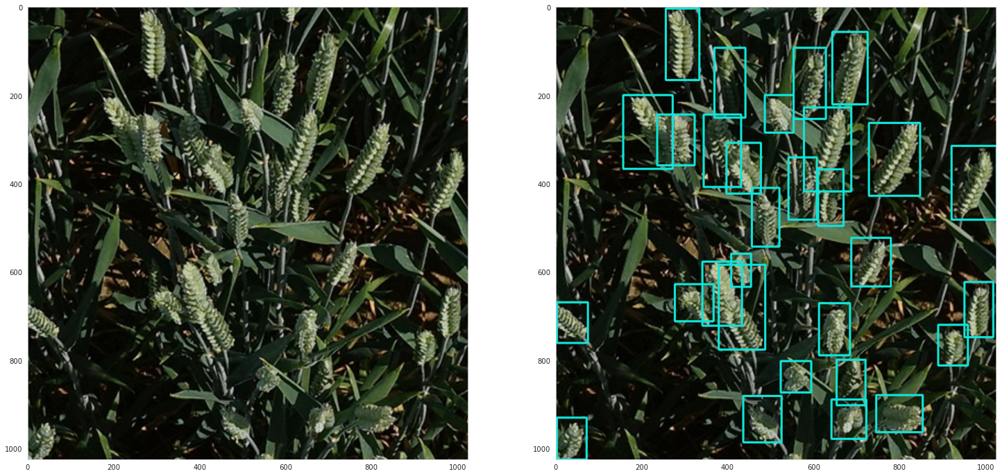

In [12]:
draw_rand()

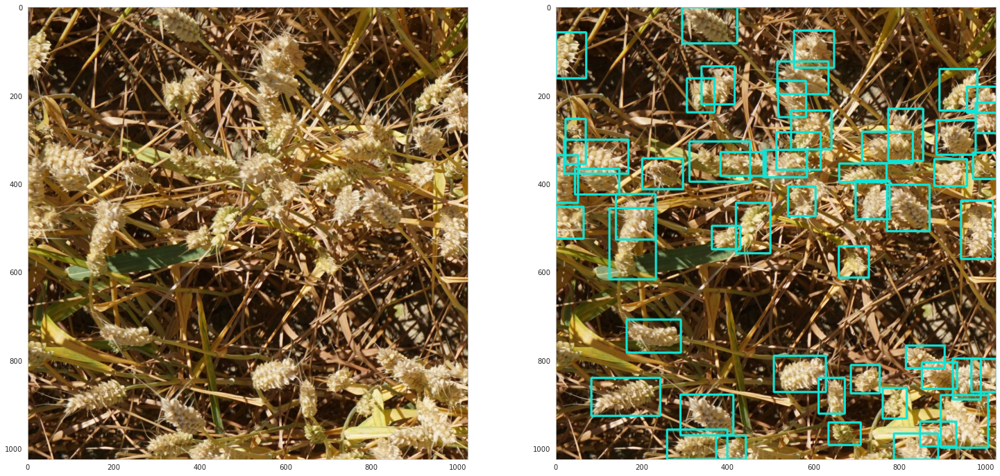

In [13]:
draw_rand()

## Data Per-Processing 

### Keras RetinaNet  https://github.com/fizyr/keras-retinanet

In [14]:
df['class_name']= 'wheat_head'
df.head()

,index,image_id,width,height,bbox,image_name,x_min,y_min,x_max,y_max,prct_area_cov,class_name
0,1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",../input/global-wheat-detection/train/b6ab77fd...,226.0,548.0,356.0,606.0,0.719070,wheat_head
1,2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",../input/global-wheat-detection/train/b6ab77fd...,377.0,504.0,451.0,664.0,1.129150,wheat_head
2,3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",../input/global-wheat-detection/train/b6ab77fd...,834.0,95.0,943.0,202.0,1.112270,wheat_head
3,4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",../input/global-wheat-detection/train/b6ab77fd...,26.0,144.0,150.0,261.0,1.383591,wheat_head
4,5,b6ab77fd7,1024,1024,"[569.0, 382.0, 119.0, 111.0]",../input/global-wheat-detection/train/b6ab77fd...,569.0,382.0,688.0,493.0,1.259708,wheat_head


In [15]:
print('Original dataframe shape',df.shape)
test=df.image_id.unique()[-10:]
test

Original dataframe shape (120902, 12)


array(['f20baf558', 'c6ca898c2', '6ef909f8f', 'a39887dc2', '47dcd5b34',
       '990c1777d', 'bce2fdc4d', 'a5c8d5f5c', 'e6b5e296d', '5e0747034'],
      dtype=object)

In [16]:
df_test= pd.DataFrame([])

for _id in tqdm(test):
    df_2=df[df.image_id==_id]
    df_test= pd.concat([df_test, df_2])
    
df_train= df
for _id in tqdm(test):
    df_train=df_train[df_train.image_id!=_id]
    
df_train=df_train.reset_index()
df_test=df_test.reset_index()

In [17]:
df_test.shape, df_train.shape

((198, 13), (120704, 13))

In [18]:
df_train= df_train[['image_name','x_min', 'y_min', 'x_max', 'y_max', 'class_name']]
print(df_train.shape)
df_train.head()

(120704, 6)


,image_name,x_min,y_min,x_max,y_max,class_name
0,../input/global-wheat-detection/train/b6ab77fd...,226.0,548.0,356.0,606.0,wheat_head
1,../input/global-wheat-detection/train/b6ab77fd...,377.0,504.0,451.0,664.0,wheat_head
2,../input/global-wheat-detection/train/b6ab77fd...,834.0,95.0,943.0,202.0,wheat_head
3,../input/global-wheat-detection/train/b6ab77fd...,26.0,144.0,150.0,261.0,wheat_head
4,../input/global-wheat-detection/train/b6ab77fd...,569.0,382.0,688.0,493.0,wheat_head


In [19]:
df_train.iloc[:,1:-1]=df_train.iloc[:,1:-1].astype('int32')
df_train.image_name= df_train.image_name.apply(lambda x: '../'+x)
df_train.head()

,image_name,x_min,y_min,x_max,y_max,class_name
0,../../input/global-wheat-detection/train/b6ab7...,226,548,356,606,wheat_head
1,../../input/global-wheat-detection/train/b6ab7...,377,504,451,664,wheat_head
2,../../input/global-wheat-detection/train/b6ab7...,834,95,943,202,wheat_head
3,../../input/global-wheat-detection/train/b6ab7...,26,144,150,261,wheat_head
4,../../input/global-wheat-detection/train/b6ab7...,569,382,688,493,wheat_head


## Model Traning

In [20]:
!git clone https://github.com/fizyr/keras-retinanet.git

Cloning into 'keras-retinanet'...
remote: Enumerating objects: 6014, done.
remote: Total 6014 (delta 0), reused 0 (delta 0), pack-reused 6014
Receiving objects: 100% (6014/6014), 13.44 MiB | 18.69 MiB/s, done.
Resolving deltas: 100% (4061/4061), done.


In [21]:
%cd keras-retinanet/
!pip install .

/kaggle/working/keras-retinanet
Processing /kaggle/working/keras-retinanet
  Created wheel for keras-retinanet: filename=keras_retinanet-0.5.1-cp37-cp37m-linux_x86_64.whl size=175135 sha256=74cbab7afbae267a861fe745143d0a3db6b4aa4dc4c64376e1f0907946c0c433
  Stored in directory: /root/.cache/pip/wheels/7f/ae/f4/f38a5a29bced2617252cb8aa726369b755c87eeef59fbba1d1
  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20487 sha256=16573ceae94bc8024bef08373892b733172fe5488f4a0e30a6bff8f075cf2136
  Stored in directory: /root/.cache/pip/wheels/bd/ef/06/5d65f696360436c3a423020c4b7fd8c558c09ef264a0e6c575
Successfully built keras-retinanet keras-resnet


In [22]:
!python setup.py build_ext --inplace

running build_ext
cythoning keras_retinanet/utils/compute_overlap.pyx to keras_retinanet/utils/compute_overlap.c
/opt/conda/lib/python3.7/site-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /kaggle/working/keras-retinanet/keras_retinanet/utils/compute_overlap.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
building 'keras_retinanet.utils.compute_overlap' extension
creating build
creating build/temp.linux-x86_64-3.7
creating build/temp.linux-x86_64-3.7/keras_retinanet
creating build/temp.linux-x86_64-3.7/keras_retinanet/utils
gcc -pthread -B /opt/conda/compiler_compat -Wl,--sysroot=/ -Wsign-compare -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -fPIC -I/opt/conda/include/python3.7m -I/opt/conda/lib/python3.7/site-packages/numpy/core/include -c keras_retinanet/utils/compute_overlap.c -o build/temp.linux-x86_64-3.7/keras_retinanet/utils/compute_overlap.o
In file in

In [23]:
import tensorflow
from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr ,preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

import requests
import urllib

In [24]:
df_train.to_csv('annotations.csv', index=False, header=None)

In [25]:
with open("classes.csv","w") as file:
    file.write("wheat_head,0")

In [26]:
PRETRAINED_MODEL = 'snapshots/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to snapshots/_pretrained_model.h5


In [27]:
!keras_retinanet/bin/train.py --freeze-backbone \
  --random-transform \
  --weights {PRETRAINED_MODEL} \
  --batch-size 8 \
  --steps 200 \
  --epochs 10 \
  csv annotations.csv classes.csv

2020-09-02 10:03:42.298364: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Creating model, this may take a second...
2020-09-02 10:03:57.540472: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-02 10:03:57.870280: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-02 10:03:57.871001: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-09-02 10:03:57.871064: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-02 10:03:

classification_submodel (Functi (None, None, 1)      2381065     P3[0][0]                         
                                                                 P4[0][0]                         
                                                                 P5[0][0]                         
                                                                 P6[0][0]                         
                                                                 P7[0][0]                         
__________________________________________________________________________________________________
regression (Concatenate)        (None, None, 4)      0           regression_submodel[0][0]        
                                                                 regression_submodel[1][0]        
                                                                 regression_submodel[2][0]        
                                                                 regression_submodel[3][0]        
          

## Trained model Analysis/Visulization of test image data

In [28]:
!ls snapshots

_pretrained_model.h5  resnet50_csv_03.h5  resnet50_csv_06.h5
resnet50_csv_01.h5    resnet50_csv_04.h5  resnet50_csv_07.h5
resnet50_csv_02.h5    resnet50_csv_05.h5


In [29]:
model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

In [30]:
%cd ../

/kaggle/working


In [31]:
def perd_from_model(path, th=0.5):
    # load image
    image = read_image_bgr(path)

    # copy to draw on
    draw = image.copy()
    draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

    # preprocess image for network
    image = preprocess_image(image)
    image, scale = resize_image(image)
    print('scale', scale)

    # process image
    start = time.time()
    boxes, scores, labels = model.predict_on_batch(np.expand_dims(image, axis=0))
    print("processing time: ", time.time() - start)

    # correct for image scale
    boxes /= scale

    # visualize detections
    for box, score, label in zip(boxes[0], scores[0], labels[0]):
    # scores are sorted so we can break
        if score < 0.5:
            break

        color = label_color(label)

        b = box.astype(int)
        draw_box(draw, b, color=color)
    return draw
        
    

In [46]:
def visu_test(df_test):
    label=test[np.random.randint(0,9)]
    data= df_test[df_test.image_id== label]
    path= '../input/global-wheat-detection/train'
    path= os.path.join(path, (label+'.jpg'))
    img= load(path)
    img2= img.copy()
    
    img2= draw_rec(img2, data.bbox.values)
    perd= perd_from_model(path, 0.3)
    
    f, ax= plt.subplots(1,3, figsize=(35,12))
    ax[0].imshow(img, aspect='auto'); ax[0].grid(False)
    ax[1].imshow(img2, aspect='auto'); ax[1].grid(False)
    ax[2].imshow(perd, aspect='auto'); ax[2].grid(False)
    
    ax[0].set_title('Original Image', size=24)
    ax[1].set_title('Original Image with B.boxes', size=24)
    ax[2].set_title('Predicted B.boxes with Image', size=24)
    plt.show()
    

scale 0.78125
processing time:  0.07125663757324219


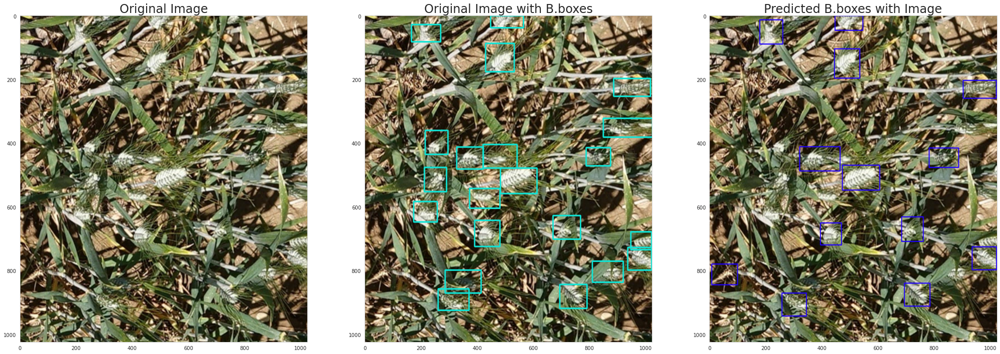

In [50]:
visu_test(df_test)

scale 0.78125
processing time:  0.07179427146911621


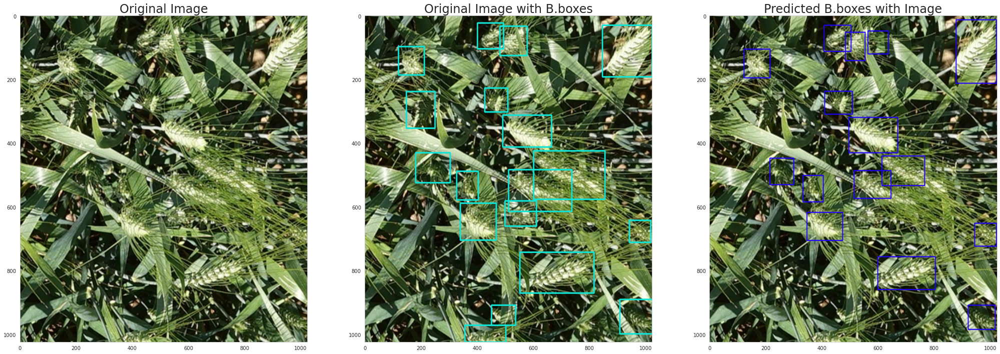

In [49]:
visu_test(df_test)

scale 0.78125
processing time:  0.07116198539733887


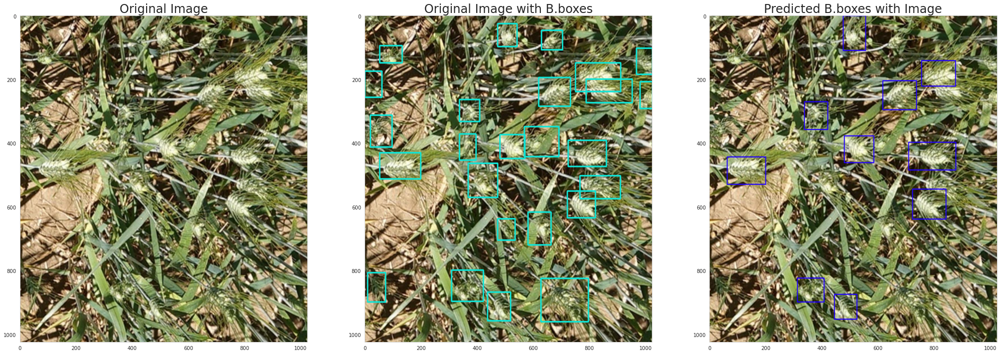

In [47]:
visu_test(df_test)

scale 0.78125
processing time:  0.0714111328125


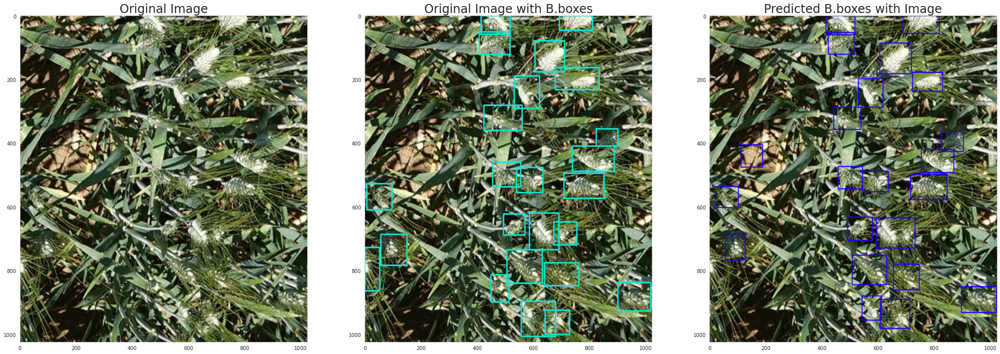

In [53]:
visu_test(df_test)